# Importações e Bibliotecas

In [4]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [5]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [6]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [7]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [8]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 200
MAX_GENERATIONS: int = 4500
BESTS: int = 5

In [9]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [10]:
m: Market = Market(r".\data\produtos.csv")

FileNotFoundError: [Errno 2] No such file or directory: '.\\data\\produtos.csv'

In [ ]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [ ]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [ ]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [ ]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [ ]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [ ]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [ ]:
c: list[int] = gerar_carrinho()
c

[392225,
 584617,
 411008,
 1602897,
 1613314,
 796084,
 1944,
 326267,
 81476,
 347653,
 284066,
 236602,
 364277,
 505570,
 95963,
 51538,
 9176,
 125107,
 449568,
 458689,
 796084,
 221359,
 174945,
 292195,
 1387081,
 13204,
 439798,
 440140,
 409753,
 462219,
 302930,
 715822,
 190855,
 104503,
 217087,
 90031,
 466678,
 409753,
 339053,
 711969,
 175471,
 336102,
 71969,
 462300,
 384522,
 1111953,
 455115,
 236619,
 50866,
 467658,
 409358,
 169774,
 199100,
 463526,
 1127409,
 1609288,
 31117,
 153540,
 454792,
 804255,
 22729,
 47384,
 328355,
 224134,
 1375784,
 505570,
 473642,
 1602897,
 1433062,
 804252,
 102476,
 528838,
 236619,
 392464,
 318932,
 56627,
 1606865,
 794143,
 424885,
 15428,
 131345,
 11672,
 583963,
 479199,
 1623448,
 37565,
 101493,
 217087,
 71812,
 169950,
 1614082,
 1614046,
 174945,
 35935,
 1433061,
 479389,
 1111943,
 218078,
 216736,
 309625]

### Geração de População Inicial

In [ ]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [ ]:
p: list[list[int]] = gerar_populacao()
p

[[323696,
  1616960,
  109875,
  120523,
  427067,
  690955,
  409753,
  99080,
  13089,
  9461,
  1944,
  568623,
  159064,
  153708,
  197994,
  467420,
  125781,
  328762,
  407910,
  108149,
  176149,
  131661,
  117446,
  302930,
  528838,
  365990,
  398436,
  409359,
  169774,
  435500,
  568622,
  13204,
  446660,
  334119,
  86559,
  411008,
  794143,
  1057832,
  697131,
  159064,
  71812,
  95963,
  117446,
  334191,
  164065,
  169774,
  335996,
  1614790,
  568597,
  454739,
  1591034,
  284066,
  161459,
  182417,
  1111953,
  65885,
  80070,
  407910,
  354327,
  282114,
  3714,
  12628,
  454792,
  344570,
  321141,
  697133,
  328355,
  462115,
  455115,
  74949,
  273342,
  530631,
  106757,
  1613312,
  1591040,
  5639,
  1614235,
  499770,
  446660,
  1376300,
  479389,
  1245489,
  395827,
  5639,
  337821,
  365395,
  145673,
  392461,
  697132,
  82880,
  439797,
  9498,
  155197,
  141168,
  1616281,
  146522,
  199100,
  34660,
  465035,
  796083],
 [1615390,
 

### Avaliação

In [ ]:
# def avaliar(individuo: list[int]) -> float:
#     valor_total: float = 0.0
#     peso_total: float = 0.0
#     volume_total: float = 0.0
#     repeticoes: int = 0
#     categorias_unicas: list = []

#     bonus = 1
#     onus = 1
    
#     pesos = {
#         'essencial': 10, # maior peso
#         'alimentos': 5.5,
#         'açougue': 1.5,
#         'beleza-e-perfumaria': 1,
#         'bebidas': 0.8, 
#         'bebidas-alcoolicas-': 0.5, # menor peso
#         'limpeza': 0.8,
#         'cuidados-pessoais': 0.8 
#     }
    
#     for id in individuo:
#         produto = m.get(id)
#         volume_total+=produto.volume
#         peso_total+=produto.weight
#         valor_total+=produto.price
#         categorias_unicas.append(produto.category)
#         repeticoes+=individuo.count(id)
#         # print(onus)

#     # Ônus
#     onus*= max(1, repeticoes)
#     onus*= max(1, volume_total - globals()['CART']['Capacidade'])
#     onus*= max(1, peso_total - globals()['CART']['PesoMaximo'])
#     onus*= max(1, valor_total - globals()['MAX_MONEY'])

#     # Bônus
#     # bonus*= len(set(categorias_unicas))
#     bonus*= sum([pesos[c]*categorias_unicas.count(c) for c in set(categorias_unicas)])


#     # Cálculo da função de fitness
#     fitness = (
#         valor_total + onus - bonus
#     )
#     return fitness**2  # Mantém a elevação ao quadrado


In [ ]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 1.5,
        'alimentos': 1.2,
        'açougue': 1.2,
        'beleza-e-perfumaria': 0.5,
        'bebidas': 0.7, 
        'bebidas-alcoolicas-': 0.3,
        'limpeza': 0.5,
        'cuidados-pessoais': 0.65 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        repeticoes+=individuo.count(id)
        
    nota = valor_total**2
    # nota = valor_total + peso_total + volume_total
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes - globals()['MAX_ITEMS'])

    # Bônus
    nota/= len(set(categorias))
    nota/= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [ ]:
# def avaliar(individuo: list[int]) -> float:
#     valor_total: float = 0.0
#     peso_total: float = 0.0
#     volume_total: float = 0.0
#     repeticoes: int = 0
#     categorias: list = []
    
#     # Variáveis adicionais para controlar diversidade e custo-benefício
#     categoria_minima = 6 # Número mínimo de categorias a serem atendidas
#     peso_maximo = globals()['CART']['PesoMaximo']
#     capacidade_maxima = globals()['CART']['Capacidade']
#     max_items = globals()['MAX_ITEMS']
    
#     for id in individuo:
#         produto = m.get(id)
#         volume_total += produto.volume
#         peso_total += produto.weight
#         valor_total += produto.price
#         categorias.append(produto.category)
#         repeticoes += individuo.count(id)
        
#     # Penalização por excesso de peso ou volume
#     nota = valor_total * peso_total * volume_total
    
#     # Penalização por violação de restrições de capacidade e peso
#     penalidade_peso = max(0, peso_total - peso_maximo) / peso_maximo
#     penalidade_volume = max(0, volume_total - capacidade_maxima) / capacidade_maxima
#     nota *= (1 + penalidade_peso + penalidade_volume)
    
#     # Penalização por valor total (não é tão severa, mas evita carrinhos excessivamente caros)
#     penalidade_valor = max(0, valor_total - globals()['MAX_MONEY']) / globals()['MAX_MONEY']
#     nota *= (1 + penalidade_valor)
    
#     # Penalização por repetição de itens (excesso de itens repetidos)
#     repeticoes_penalidade = max(0, repeticoes - max_items) / max_items
#     nota *= (1 + repeticoes_penalidade)
    
#     # Bônus por diversidade de categorias (quanto mais categorias, melhor)
#     num_categorias_distintas = len(set(categorias))
#     bonus_diversidade = num_categorias_distintas / categoria_minima if num_categorias_distintas >= categoria_minima else 1
#     nota /= bonus_diversidade
    
#     # Bônus por categorias essenciais no carrinho
#     categorias_essenciais = [cat for cat in categorias if cat == 'essencial']
#     bonus_essenciais = len(categorias_essenciais) * 0.1  # Por exemplo, 10% de bônus por cada item essencial
#     nota /= (1 - bonus_essenciais) if bonus_essenciais < 1 else 1  # Evita divisão por zero
    
#     return nota ** 2  # Aumenta a diferença entre boas e más soluções


In [ ]:
n: float = avaliar(c)
n

1.4896297205533222e+17

In [ ]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [ ]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{4500204080.358241: [323858,
  328762,
  465051,
  161459,
  117446,
  13089,
  1613589,
  176149,
  5639,
  9176,
  3893,
  339053,
  715821,
  339645,
  1614790,
  1591040,
  56627,
  1591033,
  409283,
  1591034,
  465035,
  12263,
  585414,
  466678,
  472091,
  1107472,
  1944,
  199107,
  131661,
  595320,
  29497,
  1591032,
  466678,
  141168,
  142418,
  1461013,
  65885,
  324197,
  1433068,
  109875,
  343634,
  271505,
  165471,
  86559,
  125781,
  148184,
  547124,
  1375886,
  131661,
  1591032,
  409356,
  463524,
  327625,
  339013,
  309625,
  105770,
  117446,
  182799,
  11672,
  419634,
  427413,
  1613588,
  1433064,
  1433062,
  1591033,
  512761,
  13204,
  459333,
  9176,
  90515,
  197994,
  697133,
  22306,
  463526,
  9461,
  1613588,
  97608,
  80070,
  478018,
  442458,
  165471,
  140452,
  435500,
  112743,
  180330,
  29497,
  199100,
  35935,
  1614004,
  70251,
  146389,
  336142,
  82810,
  339053,
  293935,
  80070,
  145358,
  1375886,
  584620,
  

### Seleção

In [ ]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidor_1: list[int] = random.choice(populacao)
        competidor_2: list[int] = random.choice(populacao)
                
        # Seleção do melhor individuo:
        if avaliar(competidor_1) < avaliar(competidor_2):
            vencedor: list[int] = competidor_1
        
        elif avaliar(competidor_1) > avaliar(competidor_2):
            vencedor: list[int] = competidor_2
            
        else:
            vencedor: list[int] = random.choice([competidor_1, competidor_2])
            
        if vencedor not in vencedores:
            vencedores.append(vencedor)
    
    return vencedores

In [ ]:
v1: list[list[int]] = torneio(p)
v1

[[284066,
  409358,
  348305,
  465035,
  1614235,
  1616282,
  4700,
  409538,
  690955,
  1107472,
  326267,
  102081,
  472091,
  105770,
  133870,
  5728,
  1566830,
  329010,
  321141,
  152694,
  273342,
  113943,
  584620,
  469043,
  461591,
  472638,
  455115,
  240852,
  15428,
  409358,
  74215,
  1375886,
  324326,
  615918,
  127976,
  1566830,
  78635,
  318932,
  51538,
  528838,
  339050,
  1111943,
  174284,
  283000,
  588924,
  53077,
  711969,
  478018,
  530631,
  321141,
  1591027,
  1616498,
  409283,
  334119,
  160404,
  409356,
  31117,
  30116,
  180330,
  22306,
  392225,
  711969,
  479389,
  324197,
  133870,
  343885,
  287859,
  442458,
  239675,
  479389,
  505570,
  339743,
  1628298,
  419635,
  78656,
  477921,
  178400,
  407910,
  22729,
  13918,
  343885,
  3714,
  90031,
  408465,
  55763,
  86559,
  169774,
  155197,
  1376508,
  283000,
  59785,
  792756,
  97608,
  95706,
  462115,
  794143,
  402459,
  1591035,
  31117,
  1376300],
 [409356,


In [ ]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [ ]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[1375784,
  1466989,
  418932,
  92002,
  1375784,
  101493,
  349738,
  137290,
  290020,
  59785,
  439798,
  392464,
  190728,
  99466,
  364277,
  585414,
  99080,
  165494,
  419634,
  324113,
  1628298,
  80070,
  97185,
  106572,
  197994,
  1614042,
  473642,
  462219,
  1591033,
  82810,
  283000,
  86559,
  47384,
  9176,
  220254,
  95963,
  91101,
  439798,
  199100,
  232466,
  1615398,
  284066,
  1591027,
  454739,
  584620,
  336102,
  690955,
  13627,
  168387,
  70008,
  70008,
  467613,
  168387,
  343565,
  125781,
  55835,
  343634,
  1376370,
  427861,
  175471,
  78656,
  1618553,
  427413,
  140106,
  339050,
  411008,
  131661,
  409358,
  450942,
  568623,
  74215,
  583963,
  1618553,
  125781,
  365395,
  1057832,
  1591040,
  22306,
  407910,
  9498,
  165494,
  478712,
  328762,
  1613314,
  1613312,
  1591032,
  180330,
  53077,
  339743,
  125781,
  175471,
  125224,
  164065,
  1621455,
  409355,
  9498,
  70251,
  72624,
  82880,
  335996],
 [1375784,

In [ ]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [ ]:
e: list[list[int]] = eugenia(p)
e

[[323858,
  328762,
  465051,
  161459,
  117446,
  13089,
  1613589,
  176149,
  5639,
  9176,
  3893,
  339053,
  715821,
  339645,
  1614790,
  1591040,
  56627,
  1591033,
  409283,
  1591034,
  465035,
  12263,
  585414,
  466678,
  472091,
  1107472,
  1944,
  199107,
  131661,
  595320,
  29497,
  1591032,
  466678,
  141168,
  142418,
  1461013,
  65885,
  324197,
  1433068,
  109875,
  343634,
  271505,
  165471,
  86559,
  125781,
  148184,
  547124,
  1375886,
  131661,
  1591032,
  409356,
  463524,
  327625,
  339013,
  309625,
  105770,
  117446,
  182799,
  11672,
  419634,
  427413,
  1613588,
  1433064,
  1433062,
  1591033,
  512761,
  13204,
  459333,
  9176,
  90515,
  197994,
  697133,
  22306,
  463526,
  9461,
  1613588,
  97608,
  80070,
  478018,
  442458,
  165471,
  140452,
  435500,
  112743,
  180330,
  29497,
  199100,
  35935,
  1614004,
  70251,
  146389,
  336142,
  82810,
  339053,
  293935,
  80070,
  145358,
  1375886,
  584620,
  1613314],
 [323696,

### Crossover e Mutação

In [ ]:
# def cruzamento(pais: list[list[int]], chance: float = 0.05) -> list[list[int]]:
#     pai_1: list[int] = pais[0]
#     pai_2: list[int] = pais[1]

#     probabilidade: float = round(random.uniform(0, 1), 2)

#     if probabilidade < chance:
#         pos: int = random.randint(0, len(pai_1))

#         filho_1: list[int] = pai_1[:pos] + pai_2[pos:]
#         filho_2: list[int] = pai_2[:pos] + pai_1[pos:]

#         return [filho_1, filho_2]

#     else:
#         return [pai_1, pai_2]

In [ ]:
def cruzamento(pais: list[list[int]], chance: float = 0.05, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)

    if probabilidade < chance:
        # Gerando posições de corte aleatórias
        pontos_corte = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        # Criando os filhos a partir dos pontos de corte
        filho_1 = []
        filho_2 = []

        # Inicializando as variáveis para percorrer os pais
        pos_inicio = 0

        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_1[pos_inicio:]
        filho_2 += pai_2[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [ ]:
f: list[list[int]] = cruzamento(v1)
f

[[284066,
  409358,
  348305,
  465035,
  1614235,
  1616282,
  4700,
  409538,
  690955,
  1107472,
  326267,
  102081,
  472091,
  105770,
  133870,
  5728,
  1566830,
  329010,
  321141,
  152694,
  273342,
  113943,
  584620,
  469043,
  461591,
  472638,
  455115,
  240852,
  15428,
  409358,
  74215,
  1375886,
  324326,
  615918,
  127976,
  1566830,
  78635,
  318932,
  51538,
  528838,
  339050,
  1111943,
  174284,
  283000,
  588924,
  53077,
  711969,
  478018,
  530631,
  321141,
  1591027,
  1616498,
  409283,
  334119,
  160404,
  409356,
  31117,
  30116,
  180330,
  22306,
  392225,
  711969,
  479389,
  324197,
  133870,
  343885,
  287859,
  442458,
  239675,
  479389,
  505570,
  339743,
  1628298,
  419635,
  78656,
  477921,
  178400,
  407910,
  22729,
  13918,
  343885,
  3714,
  90031,
  408465,
  55763,
  86559,
  169774,
  155197,
  1376508,
  283000,
  59785,
  792756,
  97608,
  95706,
  462115,
  794143,
  402459,
  1591035,
  31117,
  1376300],
 [409356,


In [ ]:
def mutar(populacao: list[list[int]], chance = 0.05) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [ ]:
mt: list[list[Produto]] = mutar(f)
mt

[[284066,
  409358,
  348305,
  465035,
  1614235,
  1616282,
  4700,
  409538,
  690955,
  1107472,
  326267,
  102081,
  1613312,
  105770,
  133870,
  5728,
  1566830,
  329010,
  19468,
  152694,
  273342,
  113943,
  584620,
  469043,
  461591,
  472638,
  455115,
  240852,
  15428,
  409358,
  74215,
  1375886,
  324326,
  615918,
  127976,
  1566830,
  78635,
  318932,
  51538,
  528838,
  339050,
  1111943,
  174284,
  283000,
  588924,
  53077,
  711969,
  478018,
  530631,
  321141,
  1246070,
  1616498,
  409283,
  334119,
  160404,
  409356,
  31117,
  30116,
  180330,
  22306,
  392225,
  711969,
  479389,
  324197,
  133870,
  343885,
  287859,
  442458,
  239675,
  479389,
  505570,
  339743,
  1628298,
  697132,
  78656,
  477921,
  178400,
  407910,
  22729,
  13918,
  343885,
  62145,
  90031,
  408465,
  55763,
  86559,
  169774,
  155197,
  1376508,
  283000,
  59785,
  792756,
  97608,
  95706,
  462115,
  794143,
  402459,
  1591035,
  240852,
  1376300],
 [409356

# Execução Principal

In [ ]:
relatorio: dict[dict[str: float]] = {}

In [ ]:
if __name__ == '__main__':
    i: int = 0
    
    populacao_atual: list[list[int]] = gerar_populacao()
    
    # while i < MAX_GENERATIONS and calculate_regression(relatorio) >= 1:
    while i < MAX_GENERATIONS:
        i+=1
        geracao: list[list[int]] = []
        notas: dict[float, list[int]] = mapear_notas(populacao_atual)
        
        while len(geracao) < (MAX_CARTS - BESTS):
            
            pais: list[list[int]] = torneio(populacao_atual)
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        # relatorio[i] = {'max': max(notas.keys()), 'min': min(notas.keys()), 'med': statistics.median(notas.keys())}
        values = list(notas.keys())
        relatorio[i] = {'max': values[-1], 'min': values[0], 'med': values[len(values)//2]}
        
        populacao_atual: list[list[int]] = geracao.copy()
        
        sys.stdout.write(f'\rGeração: {i}\n')

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [ ]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 1.0610816534279884e+25, 'min': 43521852958.74123, 'med': 1.0753477879626949e+17}
Geração: 2 - {'max': 1.0248741029013182e+19, 'min': 7595786804.973925, 'med': 2.6074833830689876e+16}
Geração: 3 - {'max': 2.509196900759128e+23, 'min': 3412305712.080492, 'med': 1859612979318029.5}
Geração: 4 - {'max': 2.7799777540450054e+17, 'min': 3412305712.080492, 'med': 2573751194902.794}
Geração: 5 - {'max': 6.242298750426319e+16, 'min': 815916742.9813763, 'med': 413075763698.15845}
Geração: 6 - {'max': 1.2757435329009806e+16, 'min': 815916742.9813763, 'med': 116889726480.63292}
Geração: 7 - {'max': 7143963738319158.0, 'min': 721933254.4801564, 'med': 55240326617.5334}
Geração: 8 - {'max': 1.0094736441966186e+16, 'min': 68755814.70345403, 'med': 24262375572.021477}
Geração: 9 - {'max': 1404624165043292.2, 'min': 68755814.70345403, 'med': 13107614289.891302}
Geração: 10 - {'max': 9208110396032382.0, 'min': 68755814.70345403, 'med': 6938710183.806573}
Geração: 11 - {'max': 1702051

In [ ]:
plot_generations(relatorio)

In [ ]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 4500

 [INDIVÍDUO]
Nota: 1.3110273220089389e-36
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1478.99
Peso Total: 78.67g
Volume Total: 125892.20cm³
Preço médio: R$14.7899

[PRODUTOS]
Menor preço: R$2.69
Maior preço: R$48.99
Menor peso: 0.752g
Maior peso: 1599.0g
Menor volume: 119.44800000000001cm³
Maior volume: 2516.8cm³

[CATEGORIAS]:
- bebidas: 3
- cuidados-pessoais: 2
- beleza-e-perfumaria: 1
- essencial: 87
- limpeza: 4
- bebidas-alcoolicas-: 1
- alimentos: 1
- açougue: 1

[LISTAGEM]
Café em pó 3 Corações Tradicional 500g 	 R$21.49 	 513.40g 	 1670.76cm³
Feijão Carioca Tipo 1 CAMIL Pacote 1kg 	 R$7.99 	 1012.00g 	 1305.00cm³
Feijão Carioca Tipo 1 CAMIL Pacote 1kg 	 R$7.99 	 1012.00g 	 1305.00cm³
Arroz Agulhinha Tipo 1 TIO JOÃO Pacote 1kg 	 R$8.69 	 1065.00g 	 1391.67cm³
Sabão Líquido Omo Roupas Finas e Delicadas Bebê 900 mL 	 R$21.49 	 992.00g 	 1592.08cm³
Óleo de Soja LIZA Pet 900ml 	 R$7.99 	 845.90g 	 1254.40cm³
Arroz Agulhinha Tipo 1 TIO JOÃO Pacote 1kg

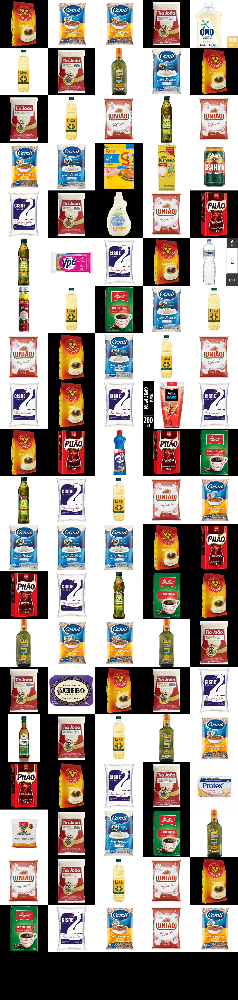

In [ ]:
mosaic(best_cart)